In [17]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import BaseCrossValidator
import numpy as np

import torch
import torch.nn as nn
from torch.utils.data import DataLoader, Dataset
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

In [18]:
nasa_df = pd.read_pickle('../Datasets/nasa_Interp_flat.pkl')
nasa_df.head()

,cell_id,rated_capacity,cycle_index,capacity,soh,voltage_raw,current_raw,charge_raw,temperature_raw,time_raw,...,t_interp_990,t_interp_991,t_interp_992,t_interp_993,t_interp_994,t_interp_995,t_interp_996,t_interp_997,t_interp_998,t_interp_999
0,B0005,2.0,1,1.856487,0.928244,"[4.191491807505295, 4.190749067776103, 3.97487...","[0.004901589207462691, 0.0014780055516425076, ...","[2.284821346956428e-05, 3.061677487183637e-05,...","[24.330033885570543, 24.325993424022467, 24.38...","[0.0, 16.781, 35.702999999999996, 53.781, 71.9...",...,24.326449,24.326098,24.330034,24.330034,24.330034,24.330034,24.330034,24.330034,24.330034,24.330034
1,B0005,2.0,3,1.846327,0.923164,"[4.189773213846608, 4.188881380279099, 3.97915...","[-2.125117981080765e-05, 0.0008794712663407272...","[-9.841657494605143e-08, 4.55081055553461e-06,...","[24.697751935729325, 24.685948163596, 24.73813...","[0.0, 16.672, 35.703, 53.828, 71.891, 90.047, ...",...,24.690022,24.697752,24.697752,24.697752,24.697752,24.697752,24.697752,24.697752,24.697752,24.697752
2,B0005,2.0,5,1.835349,0.917675,"[4.188186735991303, 4.187198338393574, 3.97999...","[0.0017540301662326099, 0.0017916477486935784,...","[8.184012417280317e-06, 1.76245030131049e-05, ...","[24.734266163954402, 24.74050014862512, 24.791...","[0.0, 16.796999999999997, 35.766, 53.891, 72.0...",...,24.734266,24.734266,24.734266,24.734266,24.734266,24.734266,24.734266,24.734266,24.734266,24.734266
3,B0005,2.0,7,1.835263,0.917631,"[4.188461118855572, 4.187752210174129, 3.98161...","[0.0027750361294468047, -0.0002337127076932362...","[1.2923959929529203e-05, 1.1691514917626872e-0...","[24.65423646922845, 24.652243741292516, 24.697...","[0.0, 16.766000000000002, 35.75, 53.813, 72.04...",...,24.654236,24.654236,24.654236,24.654236,24.654236,24.654236,24.654236,24.654236,24.654236,24.654236
4,B0005,2.0,9,1.834646,0.917323,"[4.188298524761055, 4.187384730878918, 3.98225...","[0.007980866803888688, -0.001701454824503414, ...","[3.706447558172639e-05, 2.8114350578498285e-05...","[24.524796959348127, 24.518700434435164, 24.57...","[0.0, 16.719, 35.656000000000006, 53.859, 72.0...",...,24.524797,24.524797,24.524797,24.524797,24.524797,24.524797,24.524797,24.524797,24.524797,24.524797


In [19]:
oxford_df = pd.read_pickle('../Datasets/oxford_Interp_flat.pkl')
oxford_df.head()

,cell_id,rated_capacity,cycle_index,capacity,soh,voltage_raw,current_raw,charge_raw,temperature_raw,time_raw,...,t_interp_990,t_interp_991,t_interp_992,t_interp_993,t_interp_994,t_interp_995,t_interp_996,t_interp_997,t_interp_998,t_interp_999
0,Cell1,0.74,0,0.739111,0.998799,"[4.1912351, 4.1757555, 4.1743121, 4.1726279, 4...","[0.00019483238286871092, 0.0001998942498936497...","[-0.0, 0.0001948313260934485, 0.00039978834191...","[40.026463, 40.051395, 39.988987, 39.976521, 3...","[0.0, 0.9999945759773254, 1.9999992102384567, ...",...,39.970291,39.967860,39.965425,39.962987,39.960546,39.958101,39.955654,39.953203,39.950750,39.948294
1,Cell1,0.74,100,0.730193,0.986747,"[4.1926785, 4.1765175, 4.1749935, 4.1737504, 4...","[0.00019481358446271993, 0.0001998748937739501...","[-0.0, 0.00019481252778942048, 0.0003997496296...","[39.964054, 39.8517, 39.876675, 39.914112, 39....","[0.0, 0.9999945759773254, 1.9999992102384567, ...",...,39.868830,39.868614,39.868491,39.868465,39.868536,39.868707,39.868979,39.869354,39.869834,39.870422
2,Cell1,0.74,200,0.725747,0.980739,"[4.1929593, 4.1769986, 4.1752744, 4.1739912, 4...","[0.0001947946334525561, 0.0001998590566179703,...","[-0.0, 0.00019479553618175448, 0.0003997179553...","[39.914112, 39.901646, 39.876675, 39.901646, 3...","[0.0, 1.0000046342611313, 1.9999992102384567, ...",...,39.842586,39.839024,39.835395,39.831697,39.827929,39.824091,39.820181,39.816198,39.812141,39.808010
3,Cell1,0.74,300,0.722843,0.976815,"[4.192502, 4.1766214, 4.1748571, 4.1732931, 4....","[0.0001947217497488367, 0.00019978281405714018...","[-0.0, 0.000194722652140273, 0.000399565470333...","[39.926579, 39.876675, 39.976521, 39.901646, 3...","[0.0, 1.0000046342611313, 1.9999992102384567, ...",...,39.846698,39.843177,39.839596,39.835955,39.832253,39.828488,39.824659,39.820767,39.816809,39.812785
4,Cell1,0.74,400,0.718367,0.970766,"[4.1927824, 4.1767821, 4.1753383, 4.1738949, 4...","[0.00019478819564740024, 0.0001998488756994884...","[-0.0, 0.00019478713911181032, 0.0003996975935...","[39.876675, 39.926579, 39.926579, 39.864166, 3...","[0.0, 0.9999945759773254, 1.9999992102384567, ...",...,39.870769,39.869795,39.868855,39.867950,39.867079,39.866243,39.865444,39.864681,39.863955,39.863266


In [20]:
isu_df = pd.read_pickle('../Datasets/isu_Interp_flat.pkl')
isu_df.head()

,cell_id,rated_capacity,cycle_index,capacity,soh,voltage_raw,current_raw,charge_raw,temperature_raw,time_raw,...,e_interp_990,e_interp_991,e_interp_992,e_interp_993,e_interp_994,e_interp_995,e_interp_996,e_interp_997,e_interp_998,e_interp_999
0,G1C1,0.25,0,0.280457,1.121826,"[4.184, 4.184, 4.1837, 4.183, 4.1827, 4.1827, ...","[0.05, 0.05, 0.05, 0.05, 0.05, 0.05, 0.05, 0.0...","[0.0, 1.388888888888889e-06, 2.777777777777778...",30,"[0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, ...",...,0.001518,0.001288,0.001067,0.000856,0.000655,0.000464,0.000282,0.000111,-0.000050,-0.000201
1,G1C1,0.25,1,0.279856,1.119422,"[4.1861, 4.1809, 4.1809, 4.1778, 4.1756, 4.173...","[0.05, 0.05, 0.05, 0.05, 0.05, 0.05, 0.05, 0.0...","[0.0, 6.388888888888888e-05, 6.944444444444444...",30,"[0.0, 5.0, 5.0, 10.0, 15.0, 20.0, 25.0, 30.0, ...",...,0.001168,0.000777,0.000388,0.000003,-0.000380,-0.000759,-0.001136,-0.001510,-0.001881,-0.002250
2,G1C1,0.25,2,0.278479,1.113917,"[4.1871, 4.1821, 4.1812, 4.1784, 4.1762, 4.174...","[0.05, 0.05, 0.05, 0.05, 0.05, 0.05, 0.05, 0.0...","[0.0, 4.722222222222222e-05, 6.944444444444444...",30,"[0.0, 4.0, 5.0, 10.0, 15.0, 20.0, 25.0, 30.0, ...",...,0.001739,0.001386,0.001040,0.000701,0.000368,0.000042,-0.000277,-0.000589,-0.000895,-0.001195
3,G1C1,0.25,3,0.277190,1.108761,"[4.188, 4.183, 4.1815, 4.1787, 4.1765, 4.175, ...","[0.05, 0.05, 0.05, 0.05, 0.05, 0.05, 0.05, 0.0...","[0.0, 3.611111111111111e-05, 6.944444444444444...",30,"[0.0, 3.0, 5.0, 10.0, 15.0, 20.0, 25.0, 30.0, ...",...,0.002239,0.001939,0.001650,0.001372,0.001105,0.000848,0.000603,0.000368,0.000145,-0.000067
4,G1C1,0.25,4,0.276860,1.107439,"[4.1877, 4.1827, 4.1815, 4.1787, 4.1765, 4.175...","[0.05, 0.05, 0.05, 0.05, 0.05, 0.05, 0.05, 0.0...","[0.0, 4.305555555555555e-05, 6.944444444444444...",30,"[0.0, 3.0, 5.0, 10.0, 15.0, 20.0, 25.0, 30.0, ...",...,0.001882,0.001513,0.001151,0.000797,0.000451,0.000113,-0.000218,-0.000541,-0.000857,-0.001165


In [21]:
isu_df.info()
nasa_df.info()
oxford_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5455 entries, 0 to 5454
Columns: 3023 entries, cell_id to e_interp_999
dtypes: float64(3015), int64(2), object(6)
memory usage: 125.8+ MB
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2878 entries, 0 to 2877
Columns: 3022 entries, cell_id to t_interp_999
dtypes: float64(3015), int64(1), object(6)
memory usage: 66.4+ MB
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 519 entries, 0 to 518
Columns: 3022 entries, cell_id to t_interp_999
dtypes: float64(3015), int64(1), object(6)
memory usage: 12.0+ MB


In [22]:
common_cols = [col for col in nasa_df.columns if col in oxford_df.columns and col in isu_df.columns]
common_cols = list(common_cols)

for i in range(0, len(common_cols), 10):
    print(', '.join(common_cols[i:i+10]))


cell_id, rated_capacity, cycle_index, capacity, soh, voltage_raw, current_raw, charge_raw, temperature_raw, time_raw
dqdt_min, dqdt_max, dqdt_mean, dqdt_std, dvdt_min, dvdt_max, dvdt_mean, dvdt_std, didt_min, didt_max
didt_mean, didt_std, q_interp_0, q_interp_1, q_interp_2, q_interp_3, q_interp_4, q_interp_5, q_interp_6, q_interp_7
q_interp_8, q_interp_9, q_interp_10, q_interp_11, q_interp_12, q_interp_13, q_interp_14, q_interp_15, q_interp_16, q_interp_17
q_interp_18, q_interp_19, q_interp_20, q_interp_21, q_interp_22, q_interp_23, q_interp_24, q_interp_25, q_interp_26, q_interp_27
q_interp_28, q_interp_29, q_interp_30, q_interp_31, q_interp_32, q_interp_33, q_interp_34, q_interp_35, q_interp_36, q_interp_37
q_interp_38, q_interp_39, q_interp_40, q_interp_41, q_interp_42, q_interp_43, q_interp_44, q_interp_45, q_interp_46, q_interp_47
q_interp_48, q_interp_49, q_interp_50, q_interp_51, q_interp_52, q_interp_53, q_interp_54, q_interp_55, q_interp_56, q_interp_57
q_interp_58, q_interp_5

In [23]:
def merge_battery_datasets(datasets: dict):
    """
    Merge battery datasets with a 'source' column indicating origin.

    Args:
        datasets (dict): Dictionary of DataFrames with keys as source names.
                         Example: {'nasa': nasa_df, 'oxford': oxford_df}

    Returns:
        pd.DataFrame: Merged DataFrame with 'source' column
    """
    dfs = []
    for name, df in datasets.items():
        df_copy = df.copy()
        df_copy = df_copy.drop(columns=[col for col in df_copy.columns if '_raw' in col])
        df_copy = df_copy.drop(columns=[col for col in df_copy.columns if 'e_interp' in col])
        df_copy = df_copy.drop(columns=[col for col in df_copy.columns if 't_interp' in col])
        df_copy['source'] = name
        dfs.append(df_copy)

    return pd.concat(dfs, ignore_index=True)


In [24]:
df_merged = merge_battery_datasets({
    'nasa': nasa_df,
    'oxford': oxford_df,
    'isu': isu_df
})

In [25]:
df_merged.head()

,cell_id,rated_capacity,cycle_index,capacity,soh,dqdt_min,dqdt_max,dqdt_mean,dqdt_std,dvdt_min,...,i_interp_991,i_interp_992,i_interp_993,i_interp_994,i_interp_995,i_interp_996,i_interp_997,i_interp_998,i_interp_999,source
0,B0005,2.0,1,1.856487,0.928244,-1.332504e-07,0.002876,0.000528,0.000255,-0.006229,...,0.004819,0.004902,0.004902,0.004902,0.004902,0.004902,0.004902,0.004902,0.004902,nasa
1,B0005,2.0,3,1.846327,0.923164,-4.510385e-07,0.002894,0.000527,0.000257,-0.006004,...,-0.000021,-0.000021,-0.000021,-0.000021,-0.000021,-0.000021,-0.000021,-0.000021,-0.000021,nasa
2,B0005,2.0,5,1.835349,0.917675,-1.163391e-07,0.002333,0.000520,0.000227,-0.005953,...,0.001754,0.001754,0.001754,0.001754,0.001754,0.001754,0.001754,0.001754,0.001754,nasa
3,B0005,2.0,7,1.835263,0.917631,-2.062661e-07,0.002885,0.000530,0.000255,-0.005907,...,0.002775,0.002775,0.002775,0.002775,0.002775,0.002775,0.002775,0.002775,0.002775,nasa
4,B0005,2.0,9,1.834646,0.917323,-5.353266e-07,0.002896,0.000530,0.000256,-0.005923,...,0.007981,0.007981,0.007981,0.007981,0.007981,0.007981,0.007981,0.007981,0.007981,nasa


In [26]:
df_merged.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8852 entries, 0 to 8851
Columns: 2018 entries, cell_id to source
dtypes: float64(2015), int64(1), object(2)
memory usage: 136.3+ MB


In [27]:
df_merged.to_pickle("../Datasets/merged_Interp_flat.pkl")

In [28]:
missing = df_merged.isnull().sum()
missing = missing[missing > 0]
missing


Series([], dtype: int64)

In [29]:
class BatteryWiseSplit(BaseCrossValidator):
    def __init__(self, n_splits=5, random_state=None, column_group='source'):
        self.n_splits = n_splits
        self.random_state = random_state
        self.column_group = column_group

    def get_n_splits(self, X=None, y=None, groups=None):
        return self.n_splits

    def split(self, X, y=None, groups=None):
        df = X.copy()
        if 'cell_id' not in df.columns or self.column_group not in df.columns:
            raise ValueError("DataFrame must contain 'cell_id' and column group.")

        rng = np.random.RandomState(self.random_state)
        unique_batteries = df[["cell_id", self.column_group]].drop_duplicates()
        batteries_by_source = unique_batteries.groupby(self.column_group)["cell_id"].apply(list)
        folds = [[] for _ in range(self.n_splits)]

        for source, battery_list in batteries_by_source.items():
            rng.shuffle(battery_list)
            for i, cell_id in enumerate(battery_list):
                folds[i % self.n_splits].append(cell_id)

        for i in range(self.n_splits):
            val_batteries = set(folds[i])
            train_batteries = set(unique_batteries["cell_id"]) - val_batteries
            train_idx = df[df["cell_id"].isin(train_batteries)].index.values
            val_idx = df[df["cell_id"].isin(val_batteries)].index.values
            yield train_idx, val_idx


In [ ]:
class BatteryDataset(Dataset):
    def __init__(self, X, y):
        self.X = torch.tensor(X, dtype=torch.float32)
        self.y = torch.tensor(y, dtype=torch.float32)

    def __len__(self):
        return len(self.X)

    def __getitem__(self, idx):
        return self.X[idx], self.y[idx]

class FFNN(nn.Module):
    def __init__(self, input_dim, output_dim):
        super().__init__()
        self.net = nn.Sequential(
            nn.Linear(input_dim, 512),
            nn.ReLU(),
            nn.Linear(512, 256),
            nn.ReLU(),
            nn.Linear(256, output_dim)
        )

    def forward(self, x):
        return self.net(x)

class BatteryTrainer:
    def __init__(self, df, target_cols, max_q=100, max_i=100):
        self.df = df.copy()
        self.target_cols = target_cols
        self.source_scalers = {}  # Store scalers per source

        q_cols = [c for c in df.columns if c.startswith('q_interp_')][:max_q]
        i_cols = [c for c in df.columns if c.startswith('i_interp_')][:max_i]
        self.feature_cols = q_cols + i_cols + ['cycle_index']

        self._prepare_data()

    def _normalize_by_source(self, df, fit=True):
        df = df.copy()
        for source in df['source'].unique():
            source_df = df[df['source'] == source]
            scaler = StandardScaler()
            if fit:
                self.source_scalers[source] = scaler.fit(source_df[self.feature_cols])
            df.loc[df['source'] == source, self.feature_cols] = self.source_scalers[source]\
                .transform(source_df[self.feature_cols])\
                .astype(np.float64)

        return df

    def _prepare_data(self):
        from sklearn.utils import shuffle

        splitter = BatteryWiseSplit(n_splits=5, random_state=42, column_group='source')
        self.df = self.df.reset_index(drop=True)
        train_idx, test_idx = next(splitter.split(self.df))

        self.train_idx = train_idx
        self.test_idx = test_idx

        train_df = self.df.iloc[train_idx]
        test_df = self.df.iloc[test_idx]

        train_df = self._normalize_by_source(train_df, fit=True)
        test_df = self._normalize_by_source(test_df, fit=False)

        X_train = train_df[self.feature_cols].values
        y_train = train_df[self.target_cols].values
        X_test = test_df[self.feature_cols].values
        y_test = test_df[self.target_cols].values

        self.train_loader = DataLoader(BatteryDataset(X_train, y_train), batch_size=32, shuffle=True)
        self.val_loader = DataLoader(BatteryDataset(X_test, y_test), batch_size=32)

        self.X_train, self.y_train = X_train, y_train
        self.X_val, self.y_val = X_test, y_test


    def train(self, epochs=20, lr=1e-3):
        self.model = FFNN(input_dim=self.X_train.shape[1], output_dim=len(self.target_cols))
        optimizer = torch.optim.Adam(self.model.parameters(), lr=lr)
        criterion = nn.MSELoss()

        self.train_mse, self.val_mse = [], []
        self.train_mae, self.val_mae = [], []
        self.train_r2, self.val_r2 = [], []

        for epoch in range(epochs):
            self.model.train()
            preds, targets = [], []
            for xb, yb in self.train_loader:
                pred = self.model(xb)
                loss = criterion(pred, yb)
                optimizer.zero_grad()
                loss.backward()
                optimizer.step()
                preds.append(pred.detach().numpy())
                targets.append(yb.numpy())

            preds = np.vstack(preds)
            targets = np.vstack(targets)
            self.train_mse.append(mean_squared_error(targets, preds))
            self.train_mae.append(mean_absolute_error(targets, preds))
            self.train_r2.append(r2_score(targets, preds))

            self.model.eval()
            val_preds, val_targets = [], []
            with torch.no_grad():
                for xb, yb in self.val_loader:
                    pred = self.model(xb)
                    val_preds.append(pred.numpy())
                    val_targets.append(yb.numpy())
            val_preds = np.vstack(val_preds)
            val_targets = np.vstack(val_targets)
            self.val_mse.append(mean_squared_error(val_targets, val_preds))
            self.val_mae.append(mean_absolute_error(val_targets, val_preds))
            self.val_r2.append(r2_score(val_targets, val_preds))

            print(f"Epoch {epoch+1}: Train MSE={self.train_mse[-1]:.4f}, Val MSE={self.val_mse[-1]:.4f}")

    def plot_metrics(self):
        epochs = range(1, len(self.train_mse) + 1)

        plt.figure()
        plt.plot(epochs, self.train_mse, label="Train MSE")
        plt.plot(epochs, self.val_mse, label="Val MSE")
        plt.title("MSE vs Epoch")
        plt.xlabel("Epoch")
        plt.ylabel("MSE")
        plt.legend()
        plt.grid(True)
        plt.show()

        plt.figure()
        plt.plot(epochs, self.train_mae, label="Train MAE")
        plt.plot(epochs, self.val_mae, label="Val MAE")
        plt.title("MAE vs Epoch")
        plt.xlabel("Epoch")
        plt.ylabel("MAE")
        plt.legend()
        plt.grid(True)
        plt.show()

        plt.figure()
        plt.plot(epochs, self.train_r2, label="Train R²")
        plt.plot(epochs, self.val_r2, label="Val R²")
        plt.title("R² vs Epoch")
        plt.xlabel("Epoch")
        plt.ylabel("R²")
        plt.legend()
        plt.grid(True)
        plt.show()

    def plot_split_distribution(self):
        import numpy as np
        df_train = self.df.iloc[self.train_idx]
        df_test = self.df.iloc[self.test_idx]

        train_counts = df_train['cell_id'].value_counts().sort_index()
        test_counts = df_test['cell_id'].value_counts().sort_index()
        all_cell_ids = sorted(set(self.df['cell_id']))
        train_vals = [train_counts.get(cid, 0) for cid in all_cell_ids]
        test_vals = [test_counts.get(cid, 0) for cid in all_cell_ids]

        y = np.arange(len(all_cell_ids))
        height = 0.4

        plt.figure(figsize=(10, max(6, len(all_cell_ids) * 0.2)))
        plt.barh(y, train_vals, height=height, label='Train', alpha=0.7)
        plt.barh(y + height, test_vals, height=height, label='Test', alpha=0.7)
        plt.yticks(y + height / 2, all_cell_ids, fontsize=6)
        plt.ylabel('Battery ID')
        plt.xlabel('Cycle Count')
        plt.title('Train/Test Split by Battery ID')
        plt.legend()
        plt.grid(True, axis='x', linestyle='--', alpha=0.5)
        plt.tight_layout()
        plt.show()


In [31]:
print(df_merged.columns.tolist())


['cell_id', 'rated_capacity', 'cycle_index', 'capacity', 'soh', 'dqdt_min', 'dqdt_max', 'dqdt_mean', 'dqdt_std', 'dvdt_min', 'dvdt_max', 'dvdt_mean', 'dvdt_std', 'didt_min', 'didt_max', 'didt_mean', 'didt_std', 'q_interp_0', 'q_interp_1', 'q_interp_2', 'q_interp_3', 'q_interp_4', 'q_interp_5', 'q_interp_6', 'q_interp_7', 'q_interp_8', 'q_interp_9', 'q_interp_10', 'q_interp_11', 'q_interp_12', 'q_interp_13', 'q_interp_14', 'q_interp_15', 'q_interp_16', 'q_interp_17', 'q_interp_18', 'q_interp_19', 'q_interp_20', 'q_interp_21', 'q_interp_22', 'q_interp_23', 'q_interp_24', 'q_interp_25', 'q_interp_26', 'q_interp_27', 'q_interp_28', 'q_interp_29', 'q_interp_30', 'q_interp_31', 'q_interp_32', 'q_interp_33', 'q_interp_34', 'q_interp_35', 'q_interp_36', 'q_interp_37', 'q_interp_38', 'q_interp_39', 'q_interp_40', 'q_interp_41', 'q_interp_42', 'q_interp_43', 'q_interp_44', 'q_interp_45', 'q_interp_46', 'q_interp_47', 'q_interp_48', 'q_interp_49', 'q_interp_50', 'q_interp_51', 'q_interp_52', 'q_i

In [32]:
trainer = BatteryTrainer(df_merged, target_cols=['capacity'])

C:\Users\adien\AppData\Local\Temp\ipykernel_10560\4188594234.py:45: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[-1.0938207  -1.07988699 -1.06595328 ...  0.59912495  0.62699236
  0.64092607]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df.loc[df['source'] == source, self.feature_cols] = self.source_scalers[source].transform(
C:\Users\adien\AppData\Local\Temp\ipykernel_10560\4188594234.py:45: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[-1.09382070e+00 -1.07988699e+00 -1.06595328e+00 -1.05201957e+00
 -1.03808586e+00 -1.02415216e+00 -1.01021845e+00 -9.96284737e-01
 -9.82351028e-01 -9.68417319e-01 -9.54483610e-01 -9.33583047e-01
 -9.19649337e-01 -9.05715628e-01 -8.91781919e-01 -8.77848210e-01
 -8.63914501e-01 -8.49980792e-01 -8.36047083e-01 -8.15146520e-01
 -7.87279102e-01 -7.5

Epoch 1: Train MSE=0.1563, Val MSE=0.2022
Epoch 2: Train MSE=0.0941, Val MSE=0.0996
Epoch 3: Train MSE=0.0773, Val MSE=0.0695
Epoch 4: Train MSE=0.0633, Val MSE=0.0594
Epoch 5: Train MSE=0.0634, Val MSE=0.0728
Epoch 6: Train MSE=0.0491, Val MSE=0.0513
Epoch 7: Train MSE=0.0511, Val MSE=0.0502
Epoch 8: Train MSE=0.0438, Val MSE=0.0473
Epoch 9: Train MSE=0.0434, Val MSE=0.0367
Epoch 10: Train MSE=0.0426, Val MSE=0.0386


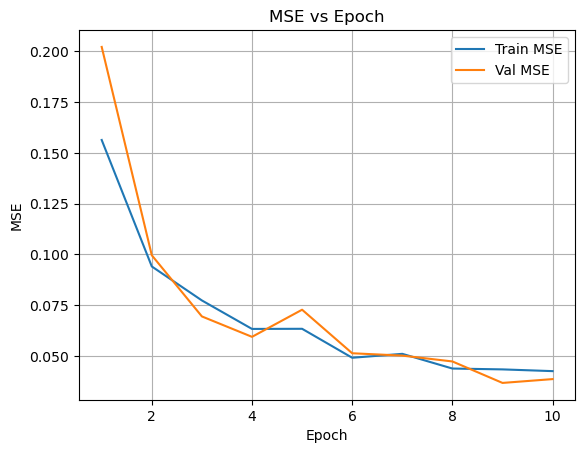

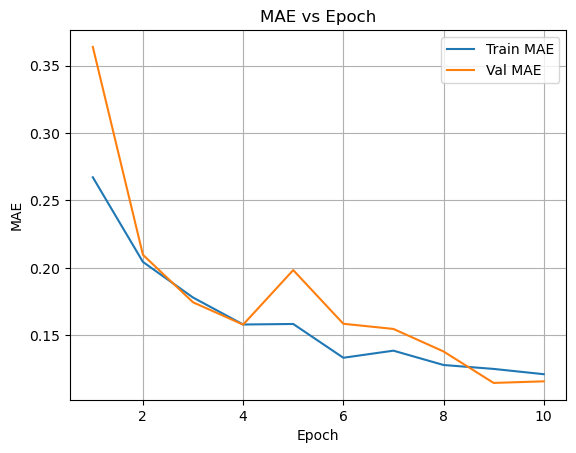

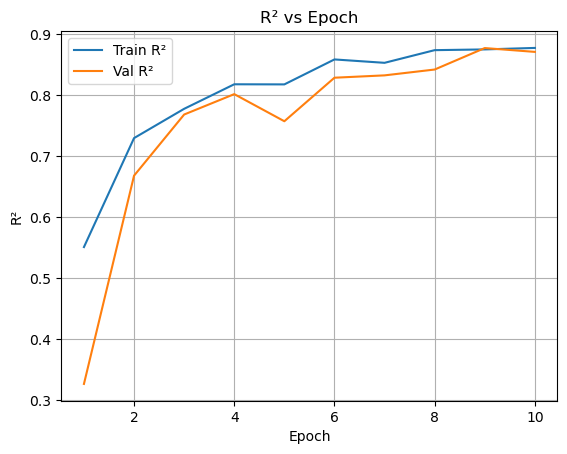

In [33]:
trainer.train(epochs=10)
trainer.plot_metrics()

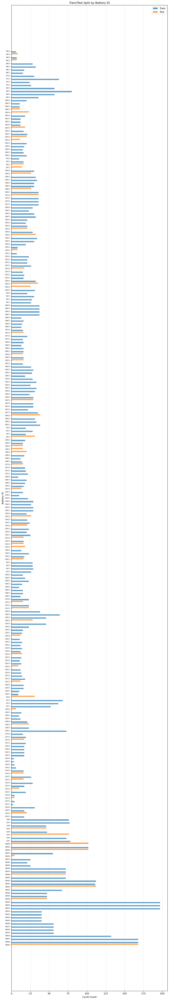

In [34]:
trainer.plot_split_distribution()

In [35]:
df_from_pickle = pd.read_pickle("../Datasets/merged_Interp_flat.pkl")

In [36]:
df_from_pickle.head()

,cell_id,rated_capacity,cycle_index,capacity,soh,dqdt_min,dqdt_max,dqdt_mean,dqdt_std,dvdt_min,...,i_interp_991,i_interp_992,i_interp_993,i_interp_994,i_interp_995,i_interp_996,i_interp_997,i_interp_998,i_interp_999,source
0,B0005,2.0,1,1.856487,0.928244,-1.332504e-07,0.002876,0.000528,0.000255,-0.006229,...,0.004819,0.004902,0.004902,0.004902,0.004902,0.004902,0.004902,0.004902,0.004902,nasa
1,B0005,2.0,3,1.846327,0.923164,-4.510385e-07,0.002894,0.000527,0.000257,-0.006004,...,-0.000021,-0.000021,-0.000021,-0.000021,-0.000021,-0.000021,-0.000021,-0.000021,-0.000021,nasa
2,B0005,2.0,5,1.835349,0.917675,-1.163391e-07,0.002333,0.000520,0.000227,-0.005953,...,0.001754,0.001754,0.001754,0.001754,0.001754,0.001754,0.001754,0.001754,0.001754,nasa
3,B0005,2.0,7,1.835263,0.917631,-2.062661e-07,0.002885,0.000530,0.000255,-0.005907,...,0.002775,0.002775,0.002775,0.002775,0.002775,0.002775,0.002775,0.002775,0.002775,nasa
4,B0005,2.0,9,1.834646,0.917323,-5.353266e-07,0.002896,0.000530,0.000256,-0.005923,...,0.007981,0.007981,0.007981,0.007981,0.007981,0.007981,0.007981,0.007981,0.007981,nasa
